# Advanced Lane Lines Detection
## NOTE: Before copying any part of this file, check with github author acjj0

In [4]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
%matplotlib inline

### Section 1: Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.




In [5]:
class CalibratedCamera:
    def __init__(self, images_paths, pattern_size=(9,6)):
        # Camera calibration matrix
        self.matrix = None
        # Camera distortion coefficient
        self.dist = None
        # Used to prepare 3D object points like [0,0,0], [1,0,0], [2,0,0], ... [0,1,0], [1,1,0], [2,1,0], ... 
        # in 9 x 6 layout
        self.pattern_size = pattern_size
        # Store already calibrated images to avoid creating them over and over again
        self.calibrated_images = []
        # Calibrate automatically when creating an object of type CalibratedCamera
        self.calibrate(images_paths)
    
    def calibrate(self, images_paths):
        # Initialize 3D object points with all 0. floats
        pattern = np.zeros((self.pattern_size[1] * self.pattern_size[0], 3), np.float32)
        
        # Create a dense multi-dimensional ‘meshgrid’ with perutations of pattern_size[0] and pattern_sizep[1] 
        # then transpose it to get to the 3D object points like [0,0,0], [1,0,0], [2,0,0], ... [0,1,0], [1,1,0], ...
        pattern[:, :2] = np.mgrid[0:self.pattern_size[0], 0:self.pattern_size[1]].T.reshape(-1, 2)
        
        # Manage points from the real world 3D image
        object_points = [] 
        
        # Manage points in the image plane
        image_points = []   
        
        # Initialize image size so that it can be used inside the loop and then outside
        image_size = None

        # Iterate through the list of images to pass into cv2.calibrateCamera
        for i, path, in enumerate(images_paths):
            # Read each image from the image file path
            image = mpimg.imread(path)
            # Convert to grayscale
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
            # Use cv2 function to locate corners of chess board
            found, corners = cv2.findChessboardCorners(gray, self.pattern_size, None)
            # If the corners are found
            if found:
                # Save each pattern used even if redundant info to meet requirement of cv2.calibrateCamera
                object_points.append(pattern)
                # Save each set of corners found
                image_points.append(corners)
                # Save the image size 
                image_size = (image.shape[1], image.shape[0])
                # Draw the corners found on to the image
                cv2.drawChessboardCorners(image, self.pattern_size, corners, True)
                # Save the image with corner identified
                self.calibrated_images.append(image)

        # If object points and image points were found, then form calibration matrix and distortion coefficent 
        # using cv2.calibrateCamera
        if object_points and image_points:
            _, self.matrix, self.dist, _, _ = cv2.calibrateCamera(objectPoints=object_points, 
                                                                  imagePoints=image_points, 
                                                                  imageSize=image_size, 
                                                                  cameraMatrix=None,
                                                                  distCoeffs=None)

    def undistort(self, image):
        return cv2.undistort(image, self.matrix, self.dist, None, self.matrix)

This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


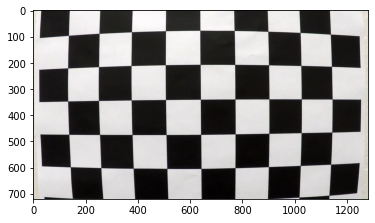

In [6]:
# Read image data from filepath
image = mpimg.imread('advanced/camera_cal/calibration1.jpg')

# Printing out some stats
print('This image is:', type(image), 'with dimensions:', image.shape)

# Display the image
plt.imshow(image)

In [7]:
# Find all the pathnames matching a specified pattern 
calibration_images_paths = glob.glob('advanced/camera_cal/calibration*.jpg')

# Create an object of CalibratedCamera class, which automatically calibrates for the given images 
calibrated_camera = CalibratedCamera(calibration_images_paths)

# Print out the calibration matrix and distortion coefficent
print("Calibration Matrix \n", calibrated_camera.matrix, "\nCalibration Distortion \n", calibrated_camera.dist)

Calibration Matrix 
 [[1.15777818e+03 0.00000000e+00 6.67113856e+02]
 [0.00000000e+00 1.15282217e+03 3.86124583e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] 
Calibration Distortion 
 [[-0.24688507 -0.02373154 -0.00109831  0.00035107 -0.00259868]]


### Section 2: Apply a distortion correction to raw images.

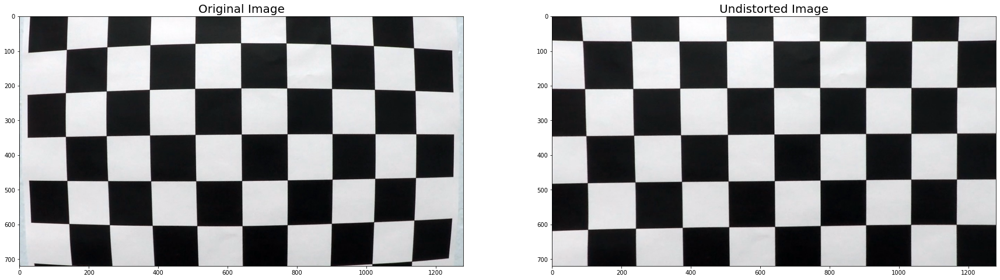

In [8]:
def show_images_sidebyside(image1, image2):
    figure, axis = plt.subplots(1, 2, figsize=(30,30))

    axis[0].imshow(image1)
    axis[0].set_title("Original Image", fontsize=20)
    axis[1].imshow(image2)
    axis[1].set_title("Undistorted Image", fontsize=20)
    
image = cv2.imread('advanced/camera_cal/calibration1.jpg')
show_images_sidebyside(image, calibrated_camera.undistort(image))    


In [ ]:
# Look at the calibrated images
plt.figure(figsize=(20, 20))
gridspec.GridSpec(5, 4)
for i, image, in enumerate(calibrated_camera.calibrated_images):
    plt.subplot2grid((5, 4), (i//4, i%4), colspan=1, rowspan=1)
    plt.imshow(image)
    plt.axis('off')
plt.show()

# Working cell. Run to see output. Output cleared to keep Github file size below 25MB max limit

In [10]:
def undistorted_image(image):
    '''
    UNDISTORTED IMAGE
    Returns an undistorted image using calculated camera
    calibration matrix and distortion coefficients.
    '''

    # Use camera calibration parameters to undistort image
    return cv2.undistort(image, calibrated_camera.matrix, calibrated_camera.dist, None, calibrated_camera.matrix)


In [ ]:
for image_path in glob.glob('advanced/test_images/*.jpg'):
    image = mpimg.imread(image_path)
    
    undistorted_image = calibrated_camera.undistort(image) # binary_image(image)
    
    show_images_sidebyside(image, undistorted_image)

# Working cell. Run to see output. Output cleared to keep Github file size below 25MB max limit    

### Section 3: Use color transforms, gradients, etc., to create a thresholded binary image.

In [12]:
def threshold_image(image, channel, threshold=(0, 255)):
    """
    Applies a threshold mask to the input image
    """
    imagechannel = image[:,:,channel]
    
    if threshold is None:  
        return imagechannel
    
    channelmask = np.zeros_like(imagechannel)
    channelmask[ (threshold[0] <= imagechannel) & (threshold[1] >= imagechannel) ] = 1
    
    return channelmask

In [13]:
def load_image(imagepath, to_rgb=True):
    """
    Load image from the given path. By default the returned image is in RGB.
    When to_rgb is set to False the image return is in BGR. 
    """
    img = cv2.imread(imagepath)
    return img if not to_rgb else cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def changecolorspaceto(image, colorspace):
    return cv2.cvtColor(image, colorspace)


def show_image_list(img_list, img_labels, title, cols=3, fig_size=(15, 12), show_ticks=True):
    """
    Utility function to to show a list of images
    """
    rows = len(img_list)
    cmap = None

    fig, axes = plt.subplots(rows, cols, figsize=fig_size)

    for i in range(0, rows):
        for j in range(0, cols):
            ax = axes[i, j] if rows > 1 else axes[j]
            #k = i * cols + j
            img_name = img_labels[i][j]
            img = img_list[i][j]
            if len(img.shape) < 3 or img.shape[-1] < 3:
                cmap = "gray"
                img = np.reshape(img, (img.shape[0], img.shape[1]))

            if not show_ticks:
                ax.axis("off")

            ax.imshow(img, cmap=cmap)
            ax.set_title(img_name)

    fig.suptitle(title, fontsize=12, fontweight='bold', y=1)
    fig.tight_layout()
    plt.show()

    return

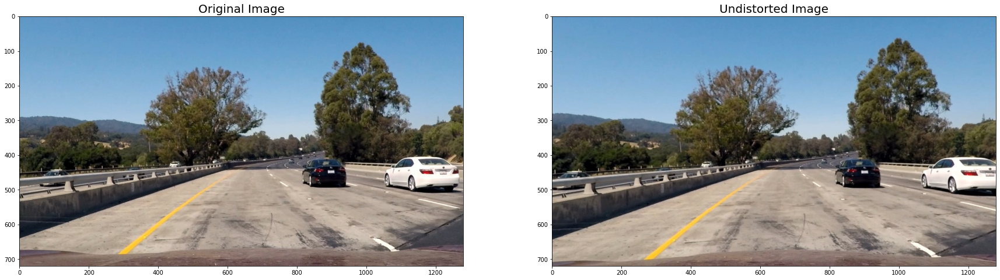

In [14]:
image = load_image("advanced/test_images/test1.jpg")
undistorted_test_image = calibrated_camera.undistort(image)
show_images_sidebyside(image, undistorted_test_image)

In [15]:
def get_threshold_colorspace(image, colorspace=None):
    if colorspace is not None:
        image = changecolorspaceto(image, colorspace)
    return np.asarray([[threshold_image(image, 0, threshold=None), 
                 threshold_image(image, 1, threshold=None), 
                 threshold_image(image, 2, threshold=None)]])

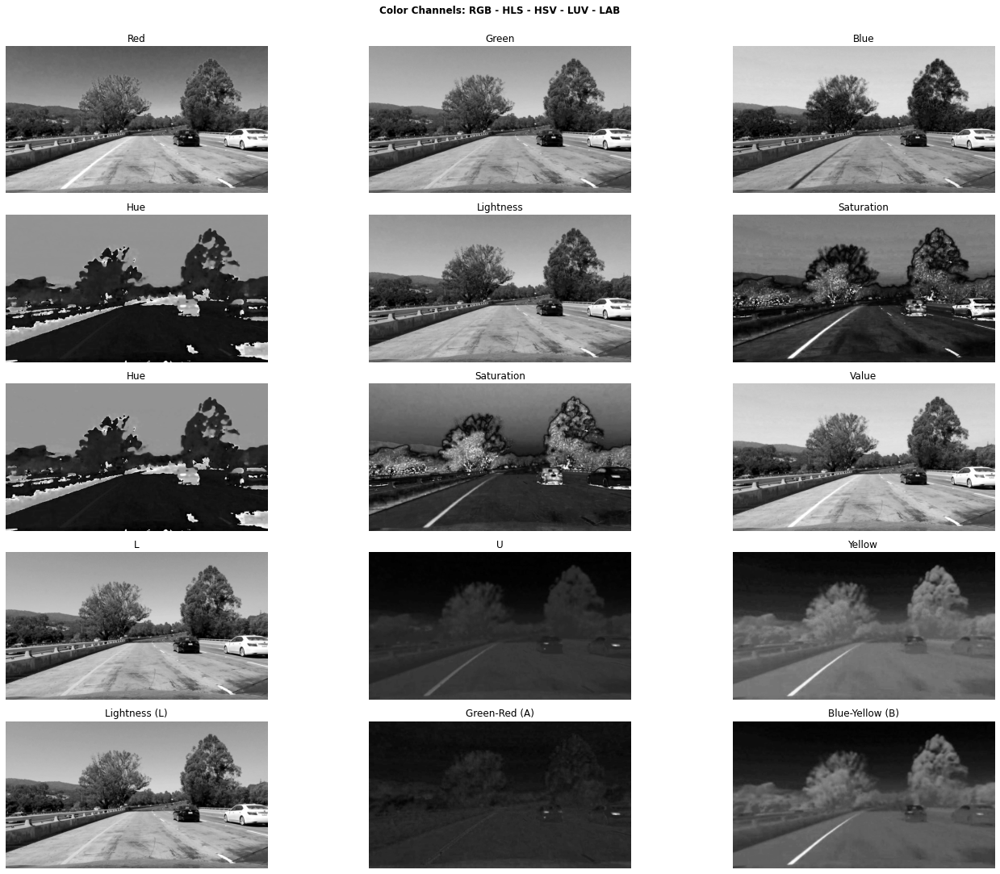

In [16]:
rgb_images = get_threshold_colorspace(undistorted_test_image)
rgb_labels = np.asarray([["Red", "Green", "Blue"]])
hls_images = get_threshold_colorspace(undistorted_test_image, cv2.COLOR_RGB2HLS)
hls_labels = np.asarray([["Hue", "Lightness", "Saturation"]])
hsv_images = get_threshold_colorspace(undistorted_test_image, cv2.COLOR_RGB2HSV)
hsv_labels = np.asarray([["Hue", "Saturation", "Value"]])
cmy_images = get_threshold_colorspace(undistorted_test_image, cv2.COLOR_RGB2LUV)
cmy_labels = np.asarray([["L", "U", "Yellow"]])
lab_images = get_threshold_colorspace(undistorted_test_image, cv2.COLOR_RGB2LAB)
lab_labels = np.asarray([["Lightness (L)", "Green-Red (A)", "Blue-Yellow (B)"]])
color_spaces_images = np.concatenate((rgb_images, hls_images, hsv_images, cmy_images, lab_images))
color_spaces_labels = np.concatenate((rgb_labels, hls_labels, hsv_labels, cmy_labels, lab_labels))
show_image_list(color_spaces_images, color_spaces_labels, "Color Channels: RGB - HLS - HSV - LUV - LAB", 
                cols=3, fig_size=(20, 15), show_ticks=False)

In [17]:
def extract_channel(image, colorspace, thresholds, channel=2):
    converted_image = cv2.cvtColor(image, colorspace)
    extracted_channel = converted_image[:,:,channel]
    binary = np.zeros_like(extracted_channel)
    binary[(extracted_channel >= thresholds[0]) & (extracted_channel <= thresholds[1])] = 1
    return binary

In [18]:
def sobel(warped_image, thresholds, sobel_type, kernel_size=3):
    gray = cv2.cvtColor(warped_image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=kernel_size)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=kernel_size)
    
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    grad = np.sqrt(sobelx**2 + sobely**2)
    
    if (sobel_type == 'x'):
        val_param = abs_sobelx
    elif (sobel_type == 'y'):
        val_param = abs_sobely
    elif (sobel_type == 'xy'):
        val_param = grad
        
    scaled_sobel = np.uint8((val_param * 255) / np.max(val_param))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel > thresholds[0]) & (scaled_sobel < thresholds[1])] = 1
    return binary_output

In [19]:
def stack_channels(warped_image, color_threshold, sobel_threshold):
    s_channel = extract_channel(warped_image, cv2.COLOR_RGB2HLS, color_threshold, 2)
    l_channel = extract_channel(warped_image, cv2.COLOR_RGB2LAB, color_threshold, 2)
#     y_channel = extract_channel(warped_image, cv2.COLOR_RGB2YUV, color_threshold, 0)
    sobelx = sobel(warped_image, sobel_threshold, 'x')
    stacked_binary = np.zeros_like(s_channel)
#     stacked_binary[(((s_channel == 1) & (l_channel==1)) & (y_channel==1)) | (sobelx == 1)] = 1
    stacked_binary[(((s_channel == 1) & (l_channel==1)) ) | (sobelx == 1)] = 1
    return stacked_binary

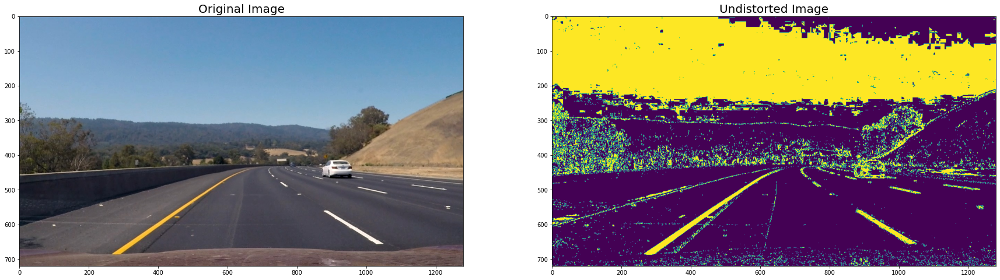

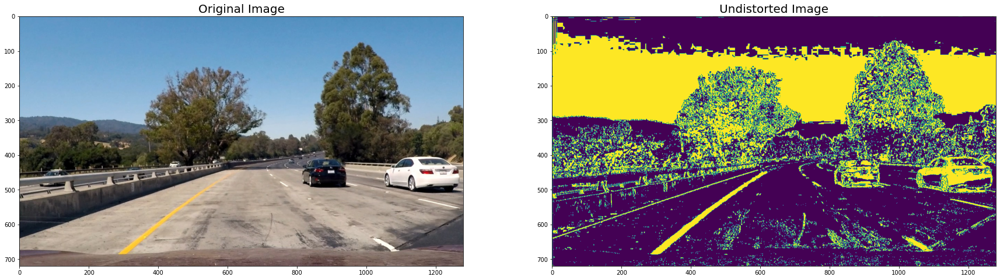

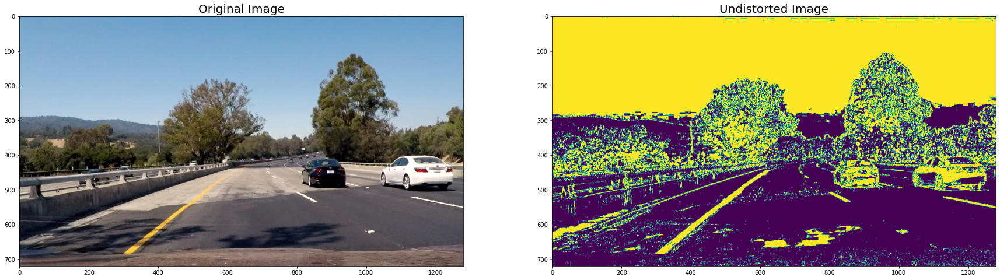

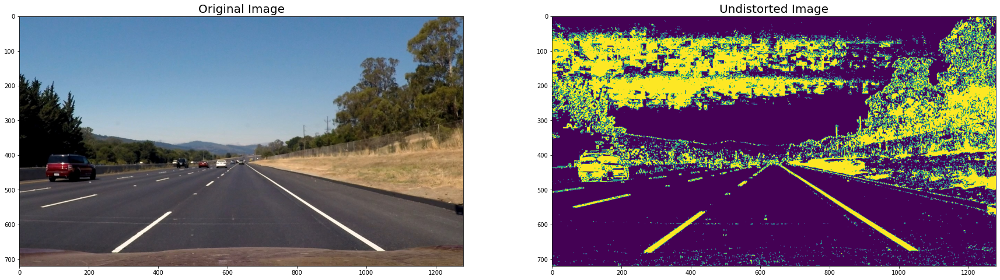

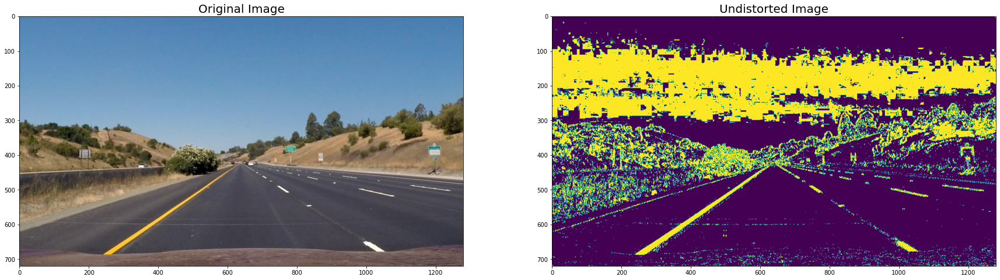

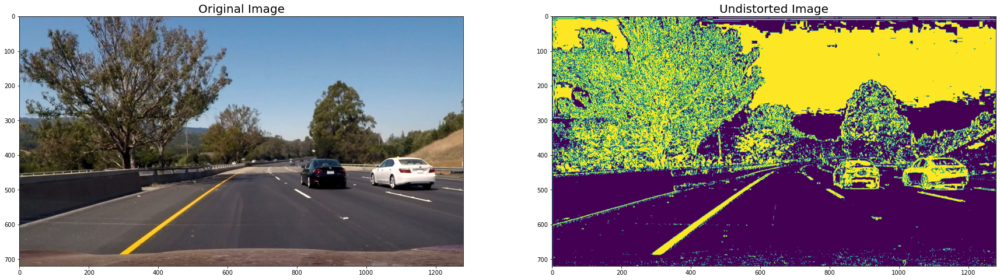

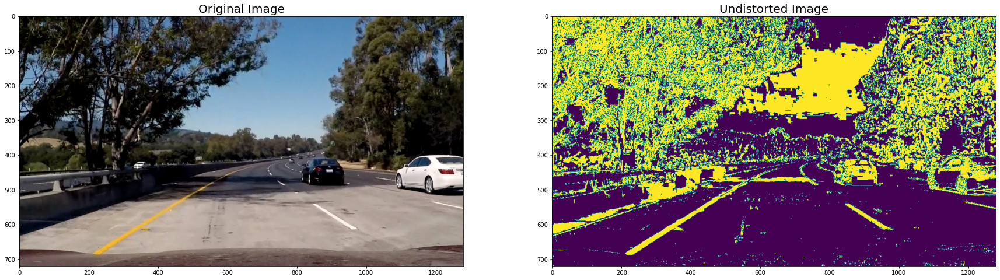

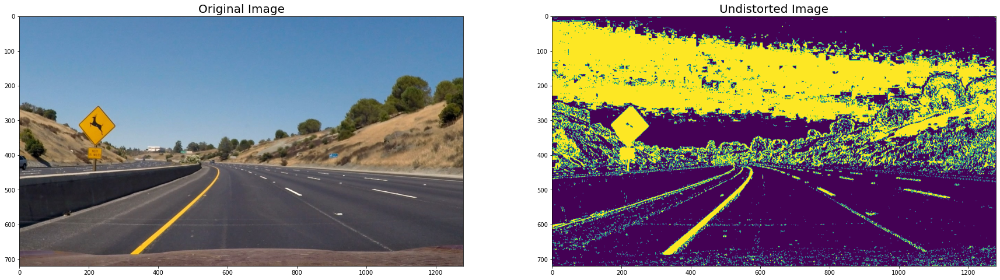

In [20]:
for image_path in glob.glob('advanced/test_images/*.jpg'):
    image = mpimg.imread(image_path)
    stacked = stack_channels(image, (100, 255), (10, 150))
    show_images_sidebyside(image, stacked)

### Section 4: Apply a perspective transform to rectify binary image ("birds-eye view").

In [21]:
def perspective_transform(image):
    imshape = image.shape
    height = imshape[0]
    width = imshape[1]
    width_ratio = 0.457
    height_ratio = 0.625
    top_left = (width * width_ratio, height * height_ratio)
    top_right = (width * (1 - width_ratio), height * height_ratio)
    bottom_left = (100, height)
    bottom_right = (width - 100, height)

    src_vertices = np.float32([top_left, top_right, bottom_left, bottom_right])
    d1 = [100, 0]
    d2 = [width - 100, 0]
    d3 = [100, height]
    d4 = [width - 100, height]
    dst_vertices = np.float32([d1, d2, d3, d4])
    matrix = cv2.getPerspectiveTransform(src_vertices, dst_vertices)
    warped = cv2.warpPerspective(image, matrix, (width, height))
    # We also calculate the oposite transform as we'll need it later
    unwarped = cv2.getPerspectiveTransform(dst_vertices, src_vertices)
    # Return the resulting image and matrix 
    return warped, unwarped

In [ ]:
for image_path in glob.glob('advanced/test_images/*.jpg'):
    image = mpimg.imread(image_path)
    transformed = perspective_transform(image)[0] 
    show_images_sidebyside(image, transformed)
    
# Working cell. Run to see output. Output cleared to keep Github file size below 25MB max limit    

Text(0.5, 1.0, 'Channel')

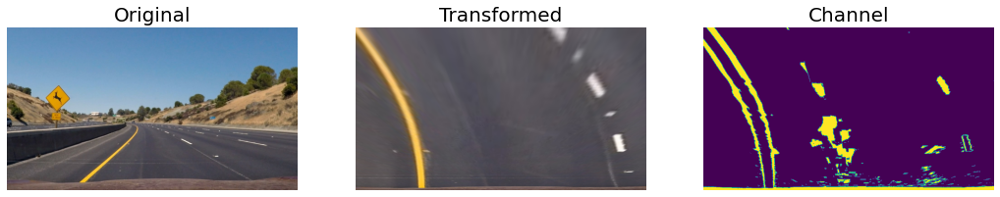

In [23]:
for image_path in glob.glob('advanced/test_images/*.jpg'):
    image = mpimg.imread(image_path)
    transformed = perspective_transform(image)[0]
    channel = extract_channel(transformed, cv2.COLOR_RGB2HLS, (20, 100))

_, (x1, x2, x3) = plt.subplots(1, 3, figsize=(18, 6))
x1.axis('off')
x1.imshow(image)
x1.set_title('Original', fontsize=20)

x2.axis('off')
x2.imshow(transformed)
x2.set_title('Transformed', fontsize=20)

x3.axis('off')
x3.imshow(channel)
x3.set_title('Channel', fontsize=20)

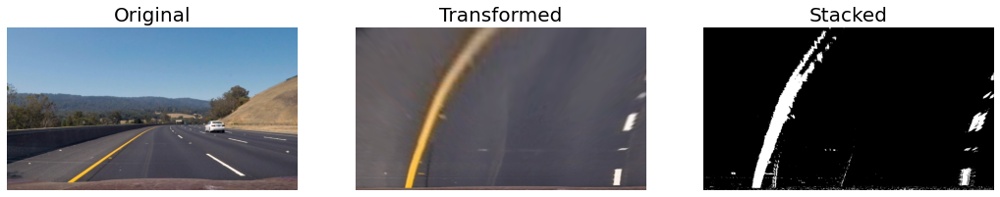

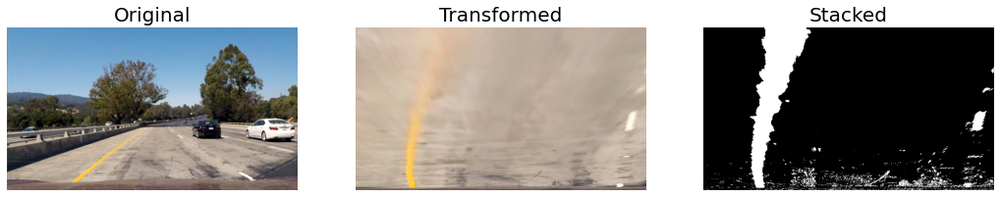

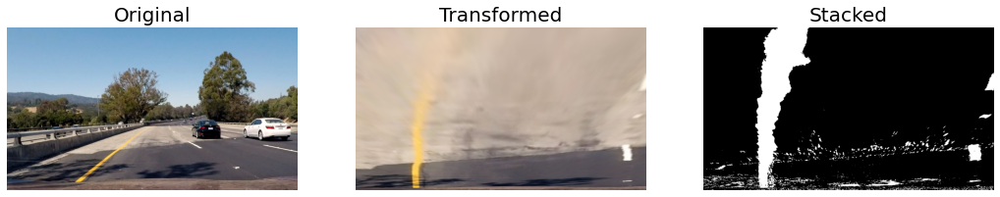

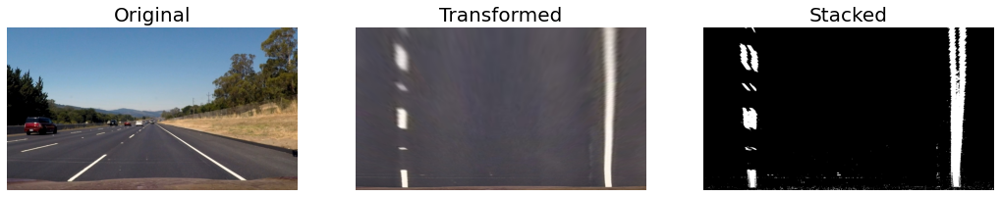

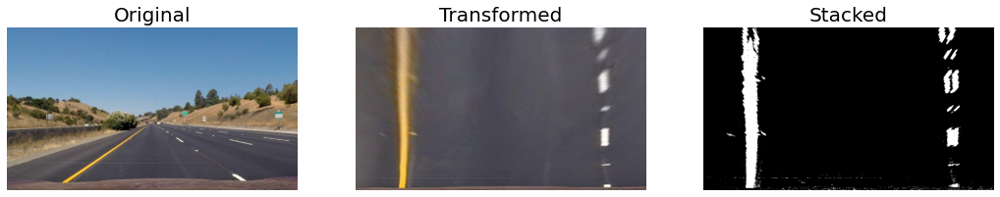

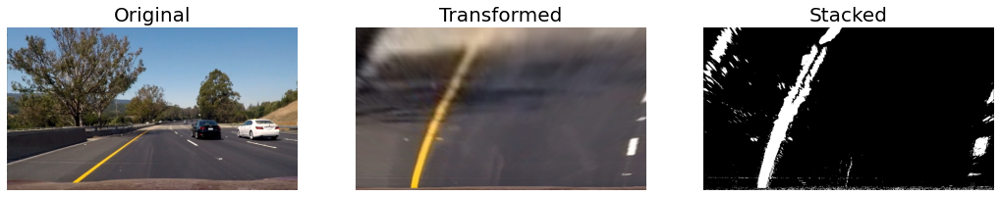

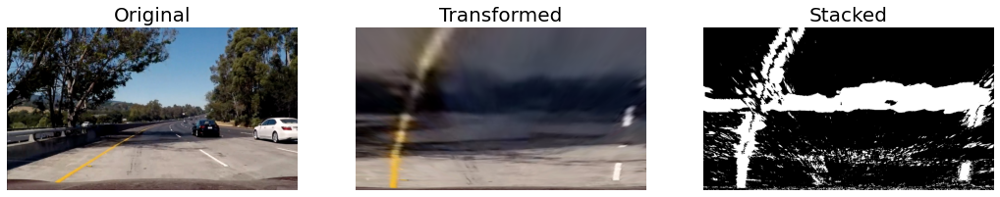

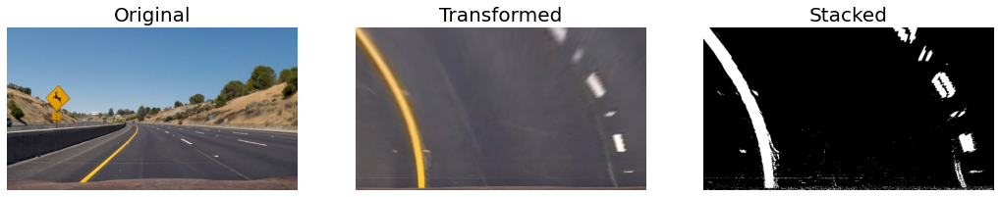

In [24]:
for image_path in glob.glob('advanced/test_images/*.jpg'):
    image = mpimg.imread(image_path)
    transformed = perspective_transform(image)[0]
    
    stacked = stack_channels(transformed, (100, 255), (10, 150))
    
#     channel = extract_channel(transformed, cv2.COLOR_RGB2HLS, (20, 100))
    _, (x1, x2, x3) = plt.subplots(1, 3, figsize=(18, 6))
    x1.axis('off')
    x1.imshow(image)
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(transformed)
    x2.set_title('Transformed', fontsize=20)

    x3.axis('off')
    x3.imshow(stacked,cmap='gray')
    x3.set_title('Stacked', fontsize=20)
    
print(" ")

### Section 5: Detect lane pixels and fit to find the lane boundary.

In [25]:
def image_histogram(warped_image):
    return np.sum(warped_image[warped_image.shape[0]//2:,:], axis=0)

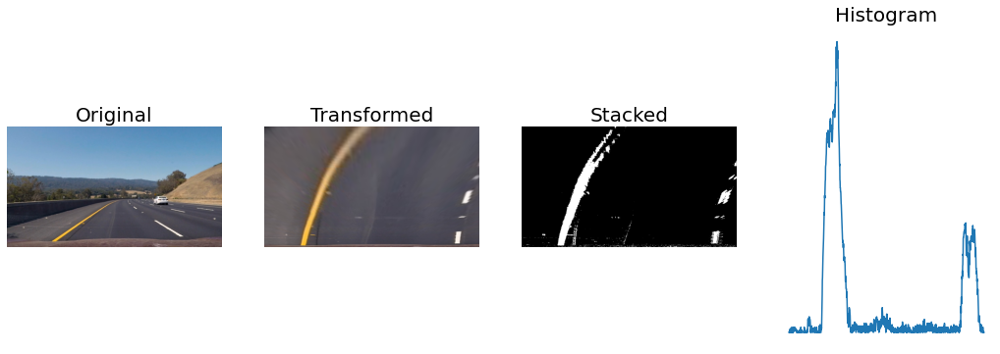

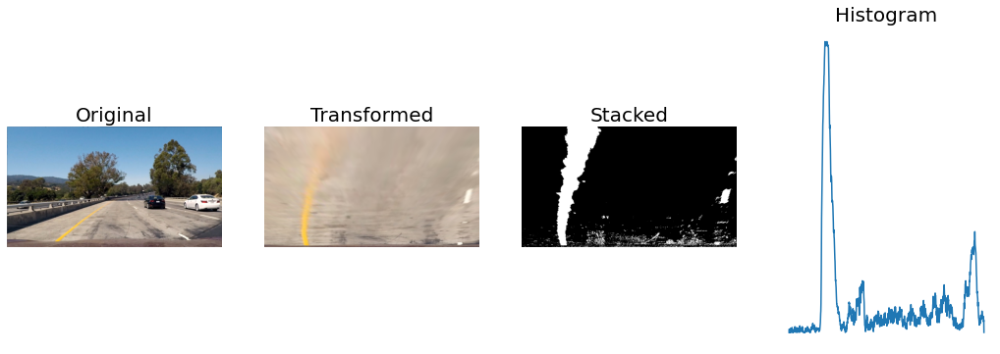

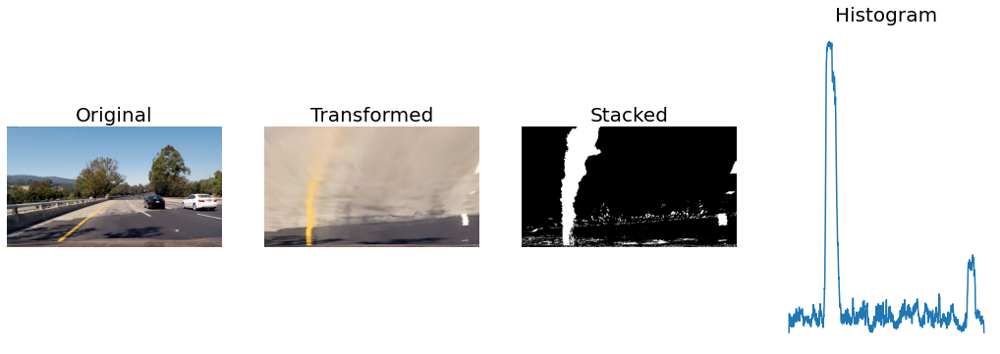

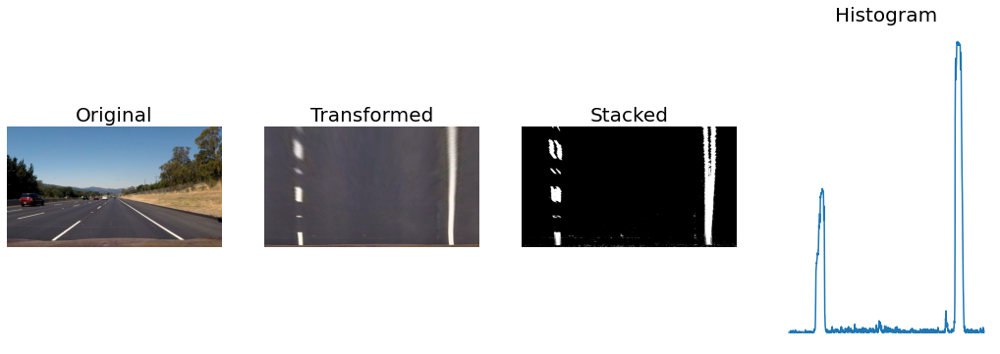

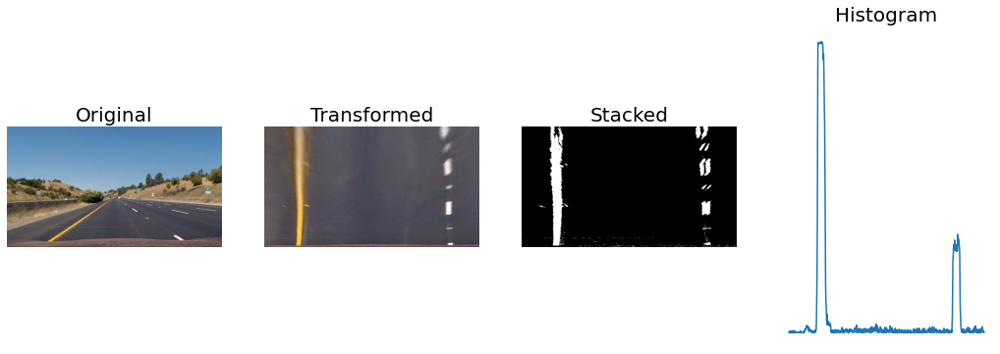

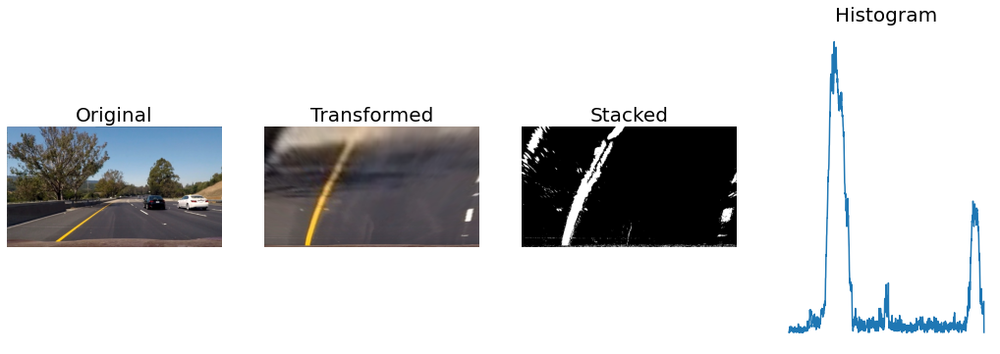

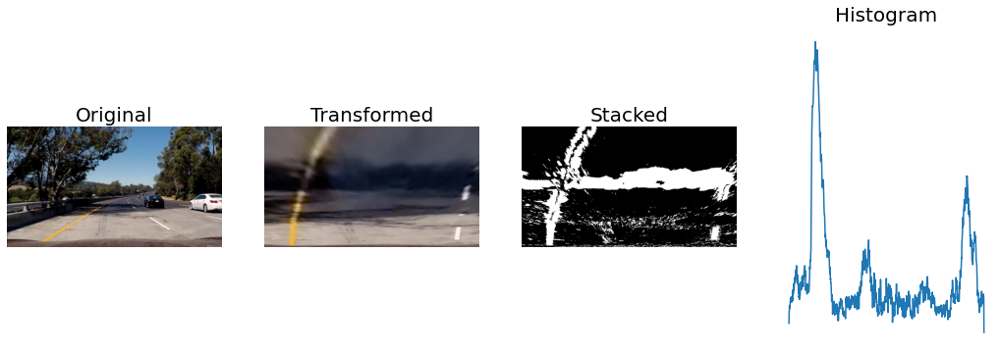

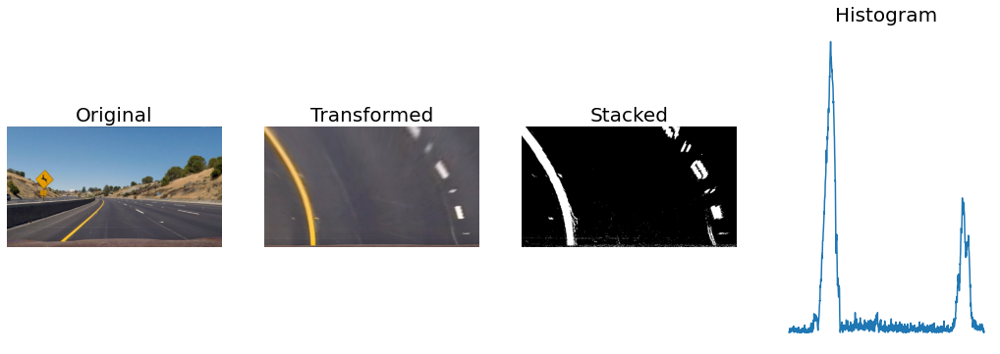

In [26]:
for image_path in glob.glob('advanced/test_images/*.jpg'):
    image = mpimg.imread(image_path)
    transformed = perspective_transform(image)[0]
    stacked = stack_channels(transformed, (100, 255), (10, 150))
    histo = image_histogram(stacked)
    _, (x1, x2, x3, x4) = plt.subplots(1, 4, figsize=(18, 6))
    x1.axis('off')
    x1.imshow(image)
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(transformed)
    x2.set_title('Transformed', fontsize=20)

    x3.axis('off')
    x3.imshow(stacked,cmap='gray')
    x3.set_title('Stacked', fontsize=20)
    
    x4.axis('off')
    x4.plot(histo)
    x4.set_title('Histogram', fontsize=20)
    
print(" ")

In [51]:
def sliding_window_search(warped_image, draw_sliding_windows=False, visualize_detected_lanes=True):
    out_img = np.dstack((warped_image, warped_image, warped_image)) * 255
    histo = image_histogram(warped_image)
    midpoint = int(histo.shape[0] / 2)
    leftx_base = np.argmax(histo[:midpoint])
    rightx_base = np.argmax(histo[midpoint:]) + midpoint
    num_windows = 9
    window_height = int(warped_image.shape[0] / num_windows)
    nonzero = warped_image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    margin = 100
    minpix = 50
    left_lane_indexes = []
    right_lane_indexes = []
    
    for window in range(num_windows):
        # Identify window boundaries in x and y (and right and left)
        top_y = warped_image.shape[0] - (window + 1) * window_height
        bottom_y = warped_image.shape[0] - window * window_height
        left_lane_leftx = leftx_current - margin
        left_lane_rightx = leftx_current + margin
        right_lane_leftx = rightx_current - margin
        right_lane_rightx = rightx_current + margin
        
        if draw_sliding_windows:
            cv2.rectangle(out_img, (left_lane_leftx, top_y), (left_lane_rightx, bottom_y), (0, 255, 0), 2) 
            cv2.rectangle(out_img, (right_lane_leftx, top_y), (right_lane_rightx, bottom_y), (0, 255, 0), 2) 

        # Identify the nonzero pixels in x and y within the window
        good_left_indexes = ((nonzeroy >= top_y) & (nonzeroy < bottom_y) & 
        (nonzerox >= left_lane_leftx) &  (nonzerox < left_lane_rightx)).nonzero()[0]
        good_right_indexes = ((nonzeroy >= top_y) & (nonzeroy < bottom_y) & 
        (nonzerox >= right_lane_leftx) &  (nonzerox < right_lane_rightx)).nonzero()[0]

        left_lane_indexes.append(good_left_indexes)
        right_lane_indexes.append(good_right_indexes)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_indexes) > minpix:
            leftx_current = int(np.mean(nonzerox[good_left_indexes]))
        if len(good_right_indexes) > minpix:        
            rightx_current = int(np.mean(nonzerox[good_right_indexes]))
    
    # Concatenate the arrays of indices
    left_lane_indexes = np.concatenate(left_lane_indexes)
    right_lane_indexes = np.concatenate(right_lane_indexes)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_indexes]
    lefty = nonzeroy[left_lane_indexes] 
    rightx = nonzerox[right_lane_indexes]
    righty = nonzeroy[right_lane_indexes] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    out_img[nonzeroy[left_lane_indexes], nonzerox[left_lane_indexes]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_indexes], nonzerox[right_lane_indexes]] = [0, 0, 255]
    ploty = np.linspace(0, warped_image.shape[0] - 1, warped_image.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty +left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    window_img = np.zeros_like(out_img)
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    if visualize_detected_lanes:
        plt.figure(figsize=(5,3))
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    
    return left_fit, right_fit

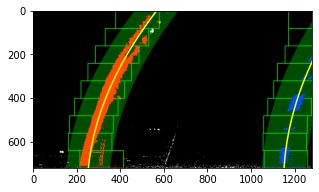

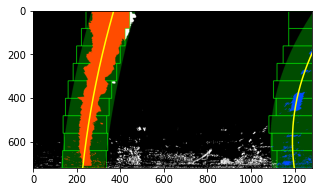

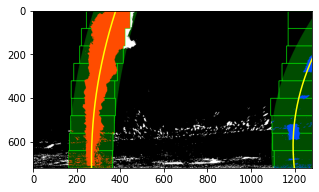

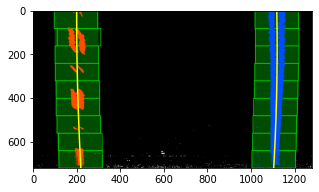

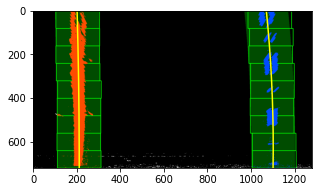

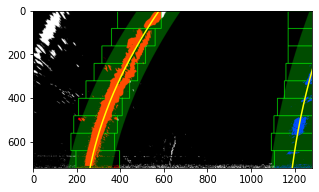

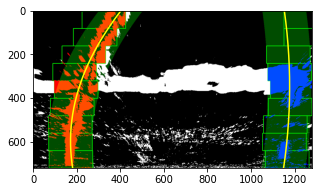

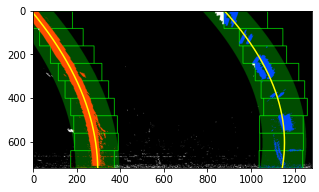

In [67]:
for image_path in glob.glob('advanced/test_images/*.jpg'):
    image = mpimg.imread(image_path)
    transformed = perspective_transform(image)[0]
    stacked = stack_channels(transformed, (100, 255), (10, 150))
    sliding_windows = sliding_window_search(stacked, draw_sliding_windows=True, visualize_detected_lanes=True)

print(" ")

### Section 6: Determine the curvature of the lane and vehicle position with respect to center.

In [53]:
def calculate_curve_radius(warped_image, left_fit, right_fit):
    ym_per_pix = 30 / warped_image.shape[0] * 0.625 # meters per pixel in y dimension
    xm_per_pix = 3.7 / warped_image.shape[1] * 0.7 # meters per pixel in x dimension
    
    ploty = np.linspace(0, warped_image.shape[0]-1, warped_image.shape[0] )
    leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty +left_fit[2]
    rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    car_position = warped_image.shape[1] // 2

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    max_y = np.max(ploty)

    # _fit is a 2 degree polynomial of the form y = ax^2 + bx + c
    # From wiki: https://en.wikipedia.org/wiki/Radius_of_curvature#In_2D
    left_first_deriv = 2 * left_fit_cr[0] + left_fit_cr[1]
    left_secnd_deriv = 2 * left_fit_cr[0]
    left_radius = int(((1 + (left_first_deriv ** 2) ** 1.5) / np.absolute(left_secnd_deriv)))
    
    right_first_deriv = 2 * right_fit_cr[0] + right_fit_cr[1]
    right_secnd_deriv = 2 * right_fit[0]
    right_radius = int(((1 + (right_first_deriv ** 2) ** 1.5) / np.absolute(right_secnd_deriv)))
    
    left_lane_bottom = (left_fit[0] * max_y)**2 + left_fit[1] * max_y + left_fit[2]
    right_lane_bottom = (right_fit[0] * max_y)**2 + right_fit[1] * max_y + right_fit[2]
    
    actual_position= (left_lane_bottom + right_lane_bottom) / 2
    
    distance = np.absolute((car_position - actual_position) * xm_per_pix)
    
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    return (left_radius + right_radius) / 2, distance
    # Example values: 632.1 m    626.2 m

In [ ]:
for image_path in glob.glob('advanced/test_images/*.jpg'):
    image = mpimg.imread(image_path)
    transformed = perspective_transform(image)
    stacked = stack_channels(transformed[0], (100, 255), (10, 150))
    sliding_windows = sliding_window_search(stacked, draw_sliding_windows=False, visualize_detected_lanes=False)
    left_fit = sliding_windows[0]
    right_fit = sliding_windows[1]
    radius, distance = calculate_curve_radius(transformed[0], left_fit, right_fit)
    cv2.putText(image, "Radius of curve is " + str(int(radius))+ "m", (100,100), 2, 1, (255,255,0), 2)
    cv2.putText(image,"Distance from center is {:2f}".format(distance)+ "m", (100,150), 2, 1, (255,255,0),2)

    _, (x1, x2) = plt.subplots(1, 2, figsize=(18, 6))
    x1.axis('off')
    x1.imshow(image)
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(image)
    x2.set_title('Final', fontsize=20)
    
# Working cell. Run to see output. Output cleared to keep Github file size below 25MB max limit

### Section 7: Warp the detected lane boundaries back onto the original image.

In [55]:
def draw_unwarped(original_image, warped_image, unwarped_image, left_fit, right_fit):
    height, width, _ = warped_image.shape
    ploty = np.linspace(0, warped_image.shape[0]-1, warped_image.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty +left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2] 
    warp_zero = np.zeros_like(warped_image).astype(np.uint8)
    color_warp = np.zeros_like(warped_image).astype(np.uint8)
   
    ploty = np.linspace(0, height - 1, num=height) # to cover same y-range as image
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    points = np.int_([pts])

    cv2.fillPoly(color_warp, points, (0, 255, 0, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (unwrapped_image)
    newwarp = cv2.warpPerspective(color_warp, unwarped_image, (width, height)) 

    result = cv2.addWeighted(original_image, 1, newwarp, 0.5, 0)
    return result

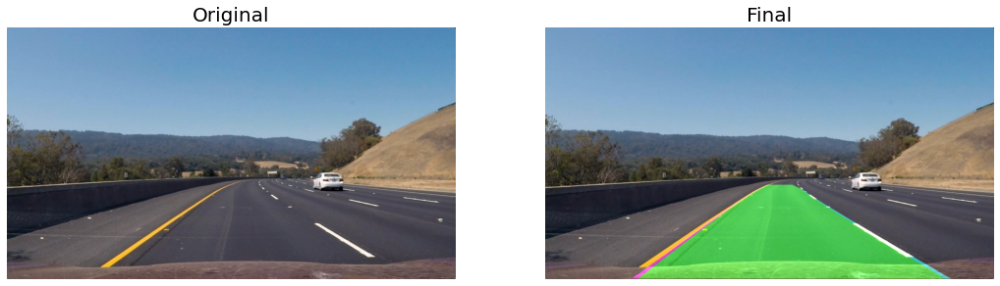

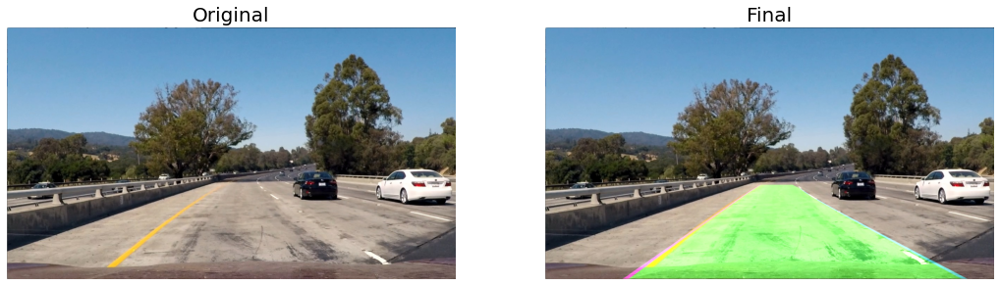

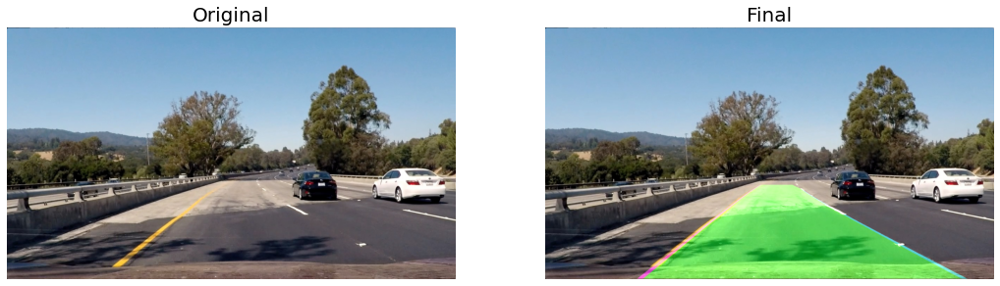

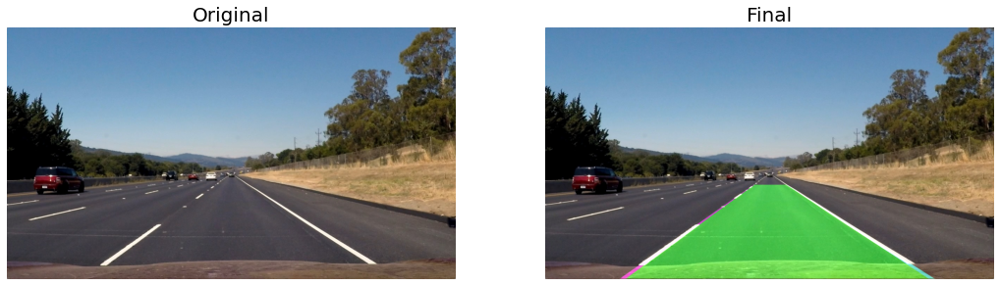

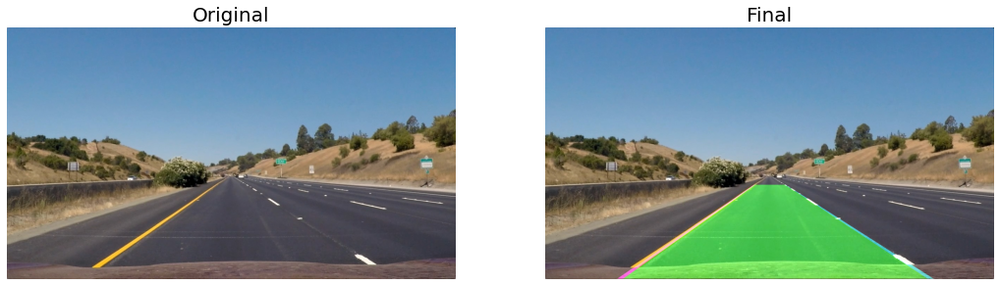

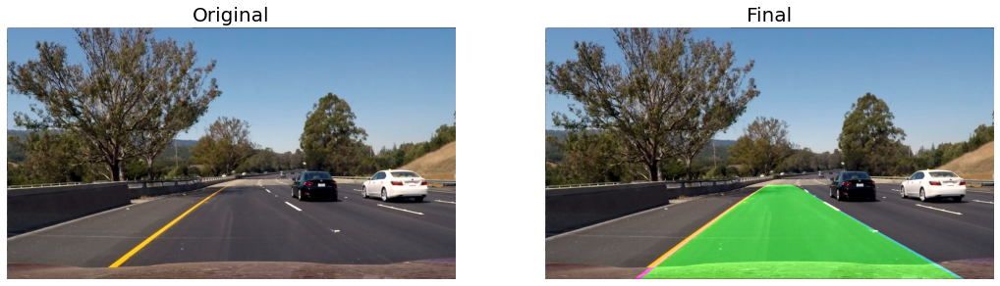

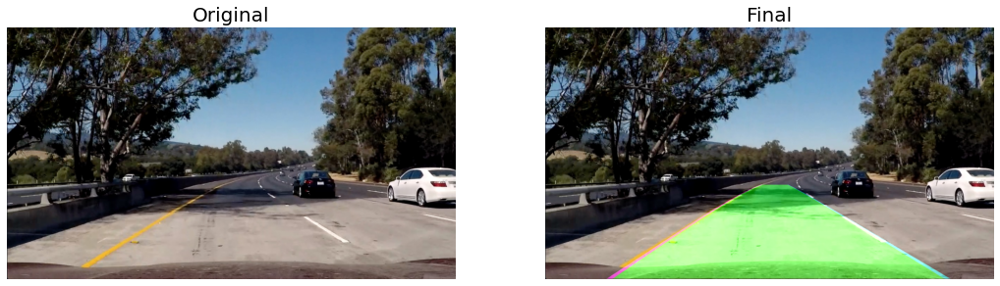

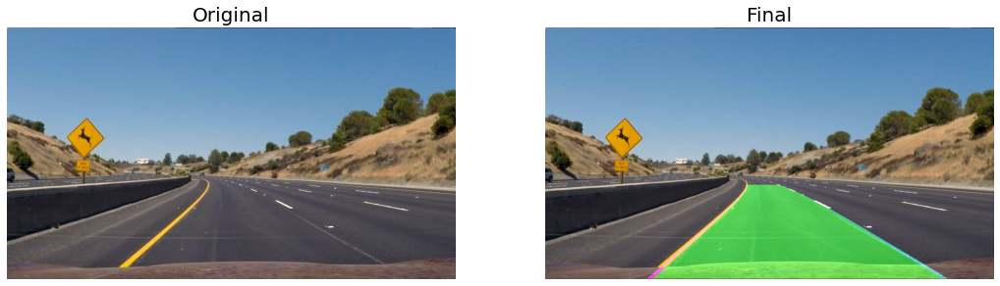

In [56]:
for image_path in glob.glob('advanced/test_images/*.jpg'):
    image = mpimg.imread(image_path)
    transformed = perspective_transform(image)
    stacked = stack_channels(transformed[0], (100, 255), (10, 150))
    sliding_windows = sliding_window_search(stacked, draw_sliding_windows=False, visualize_detected_lanes=False)
    left_fit = sliding_windows[0]
    right_fit = sliding_windows[1]
    final_image = draw_unwarped(image, transformed[0], transformed[1], left_fit, right_fit)
    _, (x1, x2) = plt.subplots(1, 2, figsize=(18, 6))
    x1.axis('off')
    x1.imshow(image)
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(final_image)
    x2.set_title('Final', fontsize=20)

### Section 8: Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [ ]:
for image_path in glob.glob('advanced/test_images/*.jpg'):
    image = mpimg.imread(image_path)
    transformed = perspective_transform(image)
    stacked = stack_channels(transformed[0], (100, 255), (10, 150))
    sliding_windows = sliding_window_search(stacked, draw_sliding_windows=False, visualize_detected_lanes=False)
    left_fit = sliding_windows[0]
    right_fit = sliding_windows[1]
    final_image = draw_unwarped(image, transformed[0], transformed[1], left_fit, right_fit)
    radius, distance = calculate_curve_radius(transformed[0], left_fit, right_fit)
    cv2.putText(final_image, "Radius of curve is " + str(int(radius))+ "m", (100,100), 2, 1, (255,255,0), 2)
    cv2.putText(final_image,"Distance from center is {:2f}".format(distance)+ "m", (100,150), 2, 1, (255,255,0),2)

    _, (x1, x2) = plt.subplots(1, 2, figsize=(18, 6))
    x1.axis('off')
    x1.imshow(image)
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(final_image)
    x2.set_title('Final', fontsize=20)
    
print(" ")

# Working cell. Run to see output. Output cleared to keep Github file size below 25MB max limit

## 

## Section 9: Pipeline for Advanced Lane Line Detection 

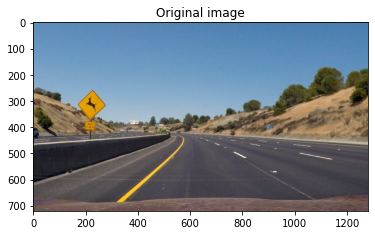

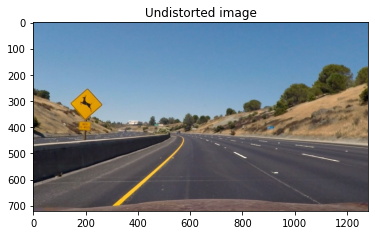

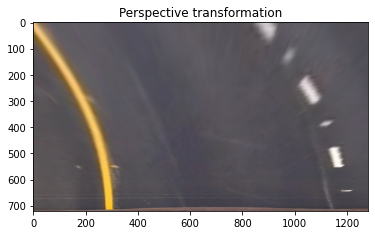

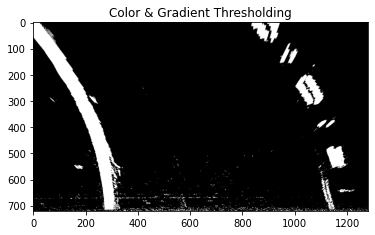

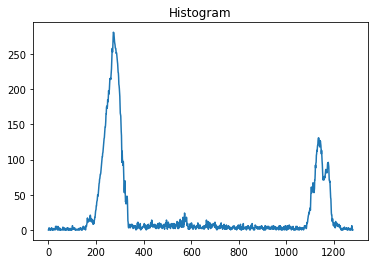

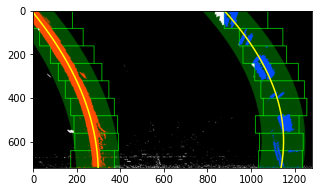

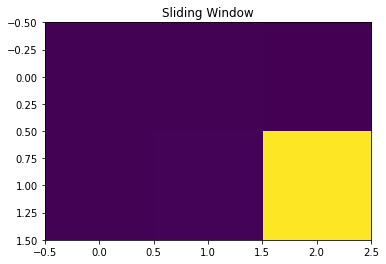

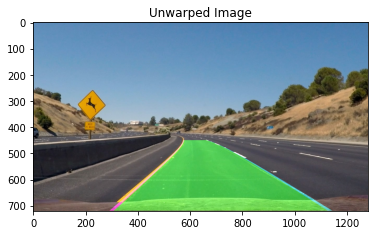

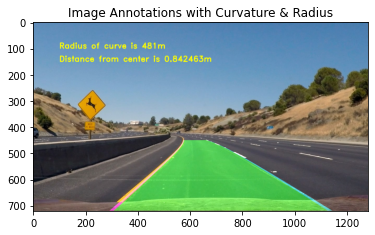

In [58]:
def image_pipeline_demo(image):
     
    # Undistorted image
    undistorted_image = calibrated_camera.undistort(image)
    plt.figure()
    plt.title("Undistorted image")
    plt.imshow(undistorted_image)
    
    # Perspective Transformation
    warped_image, unwarped_image = perspective_transform(undistorted_image)
    plt.figure()
    plt.title("Perspective transformation")
    plt.imshow(warped_image)    
    
    # Color & Gradient Thresholding 
    stacked = stack_channels(warped_image, (100, 255), (10, 150))
    plt.figure()
    plt.title("Color & Gradient Thresholding")
    plt.imshow(stacked, cmap='gray') 
    
    # Histogram
    histo = image_histogram(stacked)
    plt.figure()
    plt.title("Histogram")
    plt.plot(histo)     
    
    # Sliding Windows
    sliding_windows = sliding_window_search(stacked, draw_sliding_windows=True, visualize_detected_lanes=True)
    plt.figure()
    plt.title("Sliding Window")
    plt.imshow(sliding_windows)  

    # Unwarped Overlay
    left_fit = sliding_windows[0]
    right_fit = sliding_windows[1]
    final_image = draw_unwarped(image, warped_image, unwarped_image, left_fit, right_fit)
    plt.figure()
    plt.title("Unwarped Image")
    plt.imshow(final_image)     
    
    # Curvature and position overlay
    radius, distance = calculate_curve_radius(warped_image, left_fit, right_fit)
    cv2.putText(final_image, "Radius of curve is " + str(int(radius))+ "m", (100,100), 2, 1, (255,255,0), 2)
    cv2.putText(final_image, "Distance from center is {:2f}".format(distance)+ "m", (100,150), 2, 1, (255,255,0),2)
    plt.figure()
    plt.title("Image Annotations with Curvature & Radius")
    plt.imshow(final_image)       
    
    
image = mpimg.imread('advanced/test_images/test2.jpg')

plt.figure()
plt.title("Original image")
plt.imshow(image)

image_pipeline_demo(image)

print(" ")

In [59]:
def image_pipeline(image):
    transformed = perspective_transform(image)
    stacked = stack_channels(transformed[0], (100, 255), (10, 150))
    sliding_windows = sliding_window_search(stacked, draw_sliding_windows=False, visualize_detected_lanes=False)
    left_fit = sliding_windows[0]
    right_fit = sliding_windows[1]
    final_image = draw_unwarped(image, transformed[0], transformed[1], left_fit, right_fit)
    radius, distance = calculate_curve_radius(transformed[0], left_fit, right_fit)
    cv2.putText(final_image, "Radius of curve is " + str(int(radius))+ "m", (100,100), 2, 1, (255,255,0), 2)
    cv2.putText(final_image,"Distance from center is {:2f}".format(distance)+ "m", (100,150), 2, 1, (255,255,0),2)
    return final_image

In [ ]:
for image_path in glob.glob('advanced/test_images/*.jpg'):
    image = mpimg.imread(image_path)
    
    final_image = image_pipeline(image)
    
    _, (x1, x2) = plt.subplots(1, 2, figsize=(18, 6))
    x1.axis('off')
    x1.imshow(image)
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(final_image)
    x2.set_title('Final', fontsize=20)
    
# Working cell. Run to see output. Output cleared to keep Github file size below 25MB max limit

## Section 10: Video Processing

Working cells. Run to see output. Output cleared to keep Github file size below 25MB max limit

In [61]:
# Now let's test on a video
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
white_output = 'advanced/project_video_output.mp4'

clip1 = VideoFileClip("advanced/project_video.mp4")
white_clip = clip1.fl_image(image_pipeline)
%time white_clip.write_videofile(white_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="advanced/project_video_output.mp4">
</video>
""".format(white_output))

In [ ]:
white_output = 'advanced/challenge_video_output.mp4'

clip1 = VideoFileClip("advanced/challenge_video.mp4")
white_clip = clip1.fl_image(image_pipeline)
%time white_clip.write_videofile(white_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="advanced/challenge_video_output.mp4">
</video>
""".format(white_output))

In [ ]:
white_output = 'advanced/harder_challenge_video_output.mp4'

clip1 = VideoFileClip("advanced/harder_challenge_video.mp4")
white_clip = clip1.fl_image(image_pipeline)
%time white_clip.write_videofile(white_output, audio=False)